# Visualisation of Group Results on Surface

This uses the group maps generated in the previous companion notebook and projects them onto the freesurfer standard template using the canonical mni152.register.dat file.

### import modules

In [1]:
import os

import numpy as np
import pandas as pd

from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

from surfer import Brain, Surface, project_volume_data
from mayavi import mlab
mlab.init_notebook()

Notebook initialized with x3d backend.


In [2]:
sns.set_style('dark')

### fuction to get rid of white space

In [3]:
def crop(arr):
    """crop image
    (taken from https://github.com/mwaskom/Waskom_CerebCortex_2017/blob/master/dimensionality_reduction.ipynb)
    """
    x, y = np.argwhere((arr != 255).any(axis=-1)).T
    return arr[x.min() - 20:x.max() + 20, y.min() - 20:y.max() + 20, :]

### settings for the 4 different perspectives

In [4]:
d = {}
d['left'] = dict(azimuth=180, elevation=90,focalpoint=[0,0,0])
d['right'] = dict(azimuth=0, elevation=90,focalpoint=[0,0,0])
d['ventral'] = dict(azimuth=0, elevation=180,focalpoint=[0,0,-150])
d['dorsal'] = dict(azimuth=0, elevation=0,focalpoint=[0,0,0])

### reg file, to get volumes onto the surface

In [5]:
reg_file = "../data/external/mni152.register.dat"

### collect nifti images with group results

In [6]:
file_list = [
    '../data/processed/nii/%s' % x for x in os.listdir('../data/processed/nii/')
    if x.startswith('t') and x.endswith('.nii.gz')
]
file_list.sort()

In [7]:
file_list

['../data/processed/nii/tDiff_bilateral.nii.gz',
 '../data/processed/nii/tDiff_left.nii.gz',
 '../data/processed/nii/tDiff_right.nii.gz',
 '../data/processed/nii/tOrig_bilateral.nii.gz',
 '../data/processed/nii/tOrig_left.nii.gz',
 '../data/processed/nii/tOrig_right.nii.gz']

In [8]:
file_df = pd.DataFrame(file_list)
file_df.columns = ['filename']

In [9]:
idx = [x.split('/')[-1].split('.')[0][1:].split('_') for x in file_df.loc[:,'filename']]
idx

[['Diff', 'bilateral'],
 ['Diff', 'left'],
 ['Diff', 'right'],
 ['Orig', 'bilateral'],
 ['Orig', 'left'],
 ['Orig', 'right']]

In [10]:
file_df.index = pd.MultiIndex.from_tuples(idx)
file_df.sort_index(inplace=True)

In [11]:
file_df

filename
Diff bilateral  ../data/processed/nii/tDiff_bilateral.nii.gz
     left            ../data/processed/nii/tDiff_left.nii.gz
     right          ../data/processed/nii/tDiff_right.nii.gz
Orig bilateral  ../data/processed/nii/tOrig_bilateral.nii.gz
     left            ../data/processed/nii/tOrig_left.nii.gz
     right          ../data/processed/nii/tOrig_right.nii.gz

### add thresholds

To make the activity maps comparable between groups, even though they are of different sizes, we adapt the t-value threshold. Using GPower we compute the t-threshold necessary to find a large effect (d=0.8) with a power (1-beta) of 0.9. The thresholds are as follows:
* Left (N=39): 3.36
* Bilateral (N=10): 1.23
* Right (N=14): 1.68

In [12]:
thresh_dict = {'left':3.36,'bilateral':1.23,'right':1.68}

In [13]:
for entry in file_df.index:
    this_thresh = thresh_dict[entry[-1]]
    file_df.loc[entry,'thresh'] = this_thresh

In [14]:
file_df

filename  thresh
Diff bilateral  ../data/processed/nii/tDiff_bilateral.nii.gz    1.23
     left            ../data/processed/nii/tDiff_left.nii.gz    3.36
     right          ../data/processed/nii/tDiff_right.nii.gz    1.68
Orig bilateral  ../data/processed/nii/tOrig_bilateral.nii.gz    1.23
     left            ../data/processed/nii/tOrig_left.nii.gz    3.36
     right          ../data/processed/nii/tOrig_right.nii.gz    1.68

In [ ]:
my_min = 0.00001
my_max = 10

for cond in file_df.index.levels[0]:
    for group in file_df.index.levels[1]:

        this_map = file_df.loc[(cond,group),'filename']
        
        surf_data_lh = project_volume_data(this_map,'lh', reg_file, smooth_fwhm=0)
        surf_data_rh = project_volume_data(this_map,'rh', reg_file, smooth_fwhm=0)
        
        # apply threshold - because we want to use one colorbar for all plots,
        # we threshold the image values themselves and always use the same colorbar
        my_thresh = file_df.loc[(cond,group),'thresh']
        surf_data_lh = (surf_data_lh*(abs(surf_data_lh)>my_thresh))
        surf_data_rh = (surf_data_rh*(abs(surf_data_rh)>my_thresh))
        
        surfDict = {'lh':surf_data_lh,'rh':surf_data_rh}

        fig = plt.figure( figsize=(16,3) )

        for i,(h,view,s) in enumerate( zip(['lh','rh','lh','rh'],
                              ['left','right','right','left'],
                              [1000,1000,1000,1000]) ):

            ax = plt.subplot(1,6,i+1)
            b = Brain('fsaverage', h, 'inflated',background='white',size=s)

            b.add_overlay(surfDict[h], min=my_min,max=my_max, hemi=h)
            b.hide_colorbar()

            b.show_view(d[view])

            ax.imshow( b.screenshot() ); ax.set_xticks([]);ax.set_yticks([]);


        ################
        ax = plt.subplot(1,6,5)

        b = Brain('fsaverage', 'both', 'inflated',background='white',size=1000)
        for h in ['lh','rh']:

            b.add_overlay(surfDict[h], min=my_min,max=my_max, hemi=h)
            b.hide_colorbar()

        b.show_view(d['dorsal'])
        ax.imshow( crop(b.screenshot()) ); ax.set_xticks([]);ax.set_yticks([]);

        ################
        ax = plt.subplot(1,6,6)

        b = Brain('fsaverage', 'both', 'inflated',background='white',size=(1440,1000))
        for h in ['lh','rh']:

            b.add_overlay(surfDict[h], min=my_min,max=my_max, hemi=h)
            b.hide_colorbar()

        b.show_view(d['ventral'])
        ax.imshow(crop(b.screenshot()) ); ax.set_xticks([]);ax.set_yticks([]);

        plt.tight_layout()

        fig_name = '../temp/group_plot_%s_%s.png'%(cond,group)
        plt.savefig(fig_name,dpi=300,bbox_inches='tight')
        file_df.loc[(cond,group),'figname'] = fig_name

        plt.show()
        
# extract the colobar from the last image, for later re-use
b.show_colorbar()
whole_im = b.screenshot()
cbar_only = whole_im[-100:,:]
plt.xticks([]); plt.yticks([]);
plt.imshow( cbar_only )
plt.savefig('../temp/cBar.png',dpi=300,bbox_inches='tight')
plt.show()

# save table with image names so we don't have to re-run all of this each
# time we want to make a new large figure
file_df.to_csv('../data/processed/csv/group_data.csv')

### collect all in one big plot

re-load the table with the figure names and directories

In [22]:
file_df = pd.read_csv('../data/processed/csv/group_data.csv',index_col=[0,1],header=0)
file_df

filename  thresh  \
     Unnamed: 1                                                         
Diff bilateral   ../data/processed/nii/tDiff_bilateral.nii.gz    1.23   
     left             ../data/processed/nii/tDiff_left.nii.gz    3.36   
     right           ../data/processed/nii/tDiff_right.nii.gz    1.68   
Orig bilateral   ../data/processed/nii/tOrig_bilateral.nii.gz    1.23   
     left             ../data/processed/nii/tOrig_left.nii.gz    3.36   
     right           ../data/processed/nii/tOrig_right.nii.gz    1.68   

                                               figname  
     Unnamed: 1                                         
Diff bilateral   ../temp/group_plot_Diff_bilateral.png  
     left             ../temp/group_plot_Diff_left.png  
     right           ../temp/group_plot_Diff_right.png  
Orig bilateral   ../temp/group_plot_Orig_bilateral.png  
     left             ../temp/group_plot_Orig_left.png  
     right           ../temp/group_plot_Orig_right.png

dictionaries to specify how plots should be named

In [23]:
cond_name = {'Orig':'original','Diff':'L-R difference'}

In [24]:
fig = plt.figure(figsize=(16,14))

i = 1
sub = 0
# hard-coded order to have more control over the structure of the figure
for cond in ['Orig','Diff']:
    for g,group in enumerate(['left','bilateral','right']):
        im_name = file_df.loc[(cond,group),'figname']

        im = Image.open(im_name)
        if g==0:
            sub+=0.05
        ax = fig.add_axes([0, i-sub, 1, 1], xticklabels=[], yticklabels=[])
        if g==0:
            ax.set_title(cond_name[cond],y=0.9,fontsize=28)
        else:
            pass

        ax.set_ylabel(group,rotation=0,fontsize=24,y=0.4,labelpad=50)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(im)
    
        i-=0.2

ax = fig.add_axes([0.2, -0.3, 0.6, 1], xticklabels=[], yticklabels=[])
cbar_only = Image.open('../temp/cBar.png')
ax.imshow( cbar_only )

final_fig_name = '../reports/figures/07-surface-group.png'
plt.savefig(final_fig_name,dpi=300,bbox_inches='tight')
plt.close()

### re-load and view the saved image

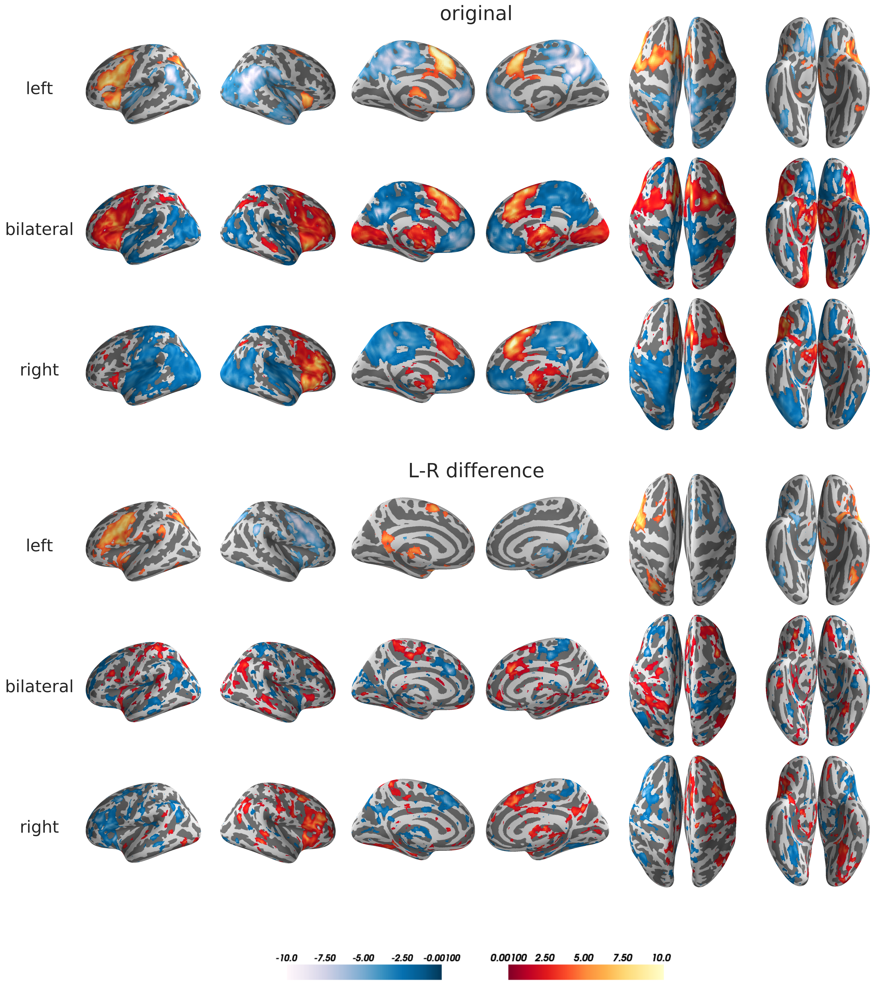

In [25]:
Image.open(final_fig_name)

### show brain map of one patient

In [27]:
p_name = 'pat101'

In [ ]:
myMin = 3
myMax = 12

this_map = '../data/interim/tMaps/tMap_%s_a.nii' %p_name

surf_data_lh = project_volume_data(this_map,'lh', reg_file, smooth_fwhm=0)
surf_data_rh = project_volume_data(this_map,'rh', reg_file, smooth_fwhm=0)
surfDict = {'lh':surf_data_lh,'rh':surf_data_rh}

fig = plt.figure( figsize=(16,3) )

for i,(h,view,s) in enumerate( zip(['lh','rh','lh','rh'],
                      ['left','right','right','left'],
                      [1000,1000,1000,1000]) ):

    ax = plt.subplot(1,6,i+1)
    b = Brain('fsaverage', h, 'inflated',background='white',size=s)

    b.add_overlay(surfDict[h], min=myMin,max=myMax, hemi=h)
    b.hide_colorbar()
    b.show_view(d[view])
    
    ax.imshow( b.screenshot() ); ax.set_xticks([]);ax.set_yticks([]);


################
ax = plt.subplot(1,6,5)

b = Brain('fsaverage', 'both', 'inflated',background='white',size=1000)
for h in ['lh','rh']:

    b.add_overlay(surfDict[h], min=myMin,max=myMax, hemi=h)
    b.hide_colorbar()
b.show_view(d['dorsal'])
ax.imshow( crop(b.screenshot()) ); ax.set_xticks([]);ax.set_yticks([]);

################
ax = plt.subplot(1,6,6)

b = Brain('fsaverage', 'both', 'inflated',background='white',size=(1440,1000))
for h in ['lh','rh']:

    b.add_overlay(surfDict[h], min=myMin,max=myMax, hemi=h)
    b.hide_colorbar()
b.show_view(d['ventral'])
ax.imshow(crop(b.screenshot()) ); ax.set_xticks([]);ax.set_yticks([]);

plt.tight_layout()

fig_name = '../examples/%s_tMapBrain.png'%p_name
plt.savefig(fig_name,dpi=300,bbox_inches='tight')

plt.show()

# extract the colobar from the last image, for later re-use
b.show_colorbar()
whole_im = b.screenshot()
cbar_only = whole_im[-100:,:]
plt.imshow( cbar_only )
plt.xticks([]);plt.yticks([])
fig_name = '../examples/%s_tMapCbar.png'%p_name
plt.savefig(fig_name,dpi=300,bbox_inches='tight')
plt.show()

### summary  

For the original images, we see a protypical language network with Inferior Frontal, Medial Frontal Areas, SMA and VWFA. The difference images emphasize these regions further.


**************

< [Previous](06-mw-make-group-ims.ipynb) | [Contents](00-mw-overview-notebook.ipynb) | [Next >](08-mw-methods-plot-correlations.ipynb)